## Vision Project - Book Illustrations

This notebook contains the tests that I ran for generating book cover images using diffusion with the book illustration concept loaded. Please not that I did not seed the generator for any of tests, so the results may differ when you run them.

In [12]:
# Install diffusers

! pip install diffusers
! pip install ipython


[notice] A new release of pip is available: 23.2.1 -> 24.1.2
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 23.2.1 -> 24.1.2
[notice] To update, run: pip install --upgrade pip


In [11]:
# Import required modules

from diffusers import DiffusionPipeline
from diffusers import AutoPipelineForInpainting
from diffusers import StableDiffusionInpaintPipeline

from diffusers.utils import load_image

import torch

To give the images generated some style, the stable diffusion base model was fine tuned using textual inversion on a dataset of 10 book illustrations.

In [12]:
# Load the diffusion pipeline for stable diffusion 

model_id = "../models/stable-diffusion-v1-5"
stable_diffusion = DiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16,variant="fp16", use_safetensors=True, safety_checker=None ).to("mps")


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In [13]:
# Add concept
stable_diffusion.load_textual_inversion("sd-book-illustrations", use_safetensors=True)

## Inference

100%|██████████| 25/25 [00:15<00:00,  1.62it/s]


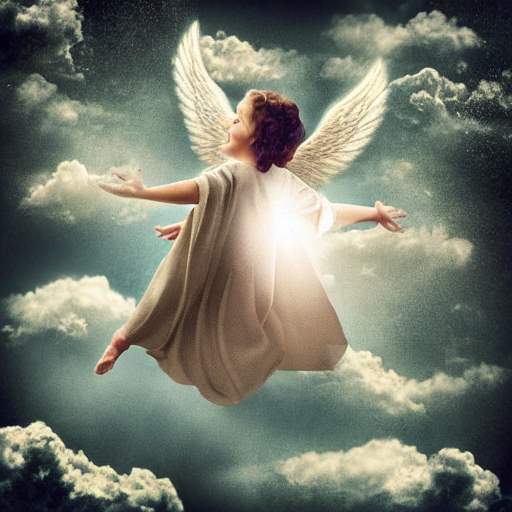

In [5]:
# Inference without adding a concept

prompt = "An angel flying through the sky filled with clouds"
image = stable_diffusion(prompt, num_inference_steps=25).images[0]

image


100%|██████████| 25/25 [00:14<00:00,  1.68it/s]


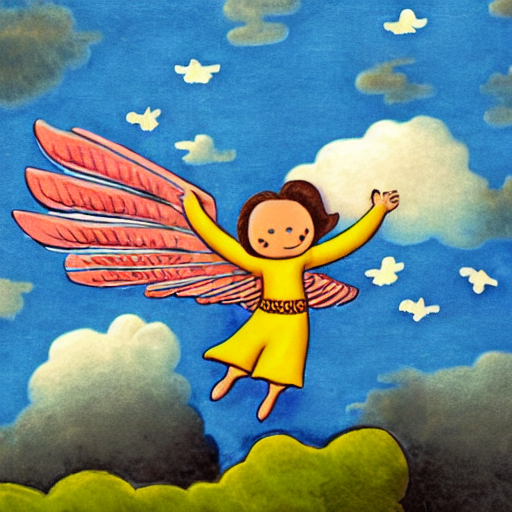

In [7]:
# Inference with a concept

prompt = "An angel flying through the sky filled with clouds, <book-illustration> style"
image = stable_diffusion(prompt, num_inference_steps=25).images[0]

image

Here I attempted to generate an image with some text superimposed on the image, however this did not produce very good results.

100%|██████████| 25/25 [00:27<00:00,  1.10s/it]


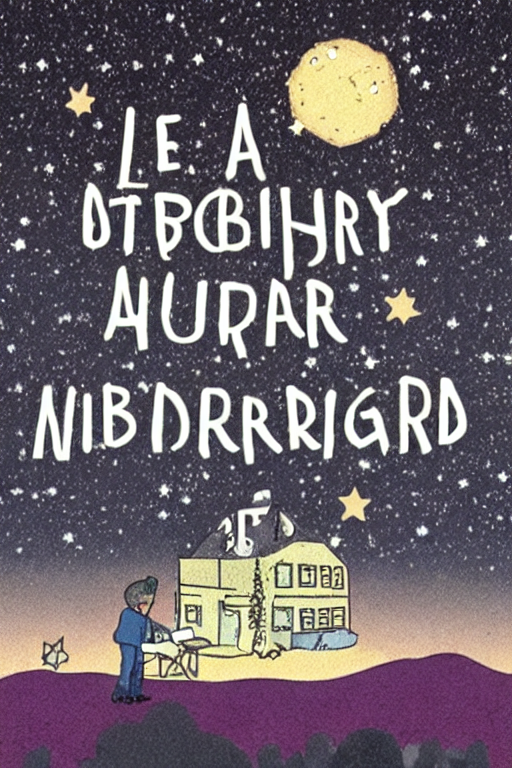

In [10]:
# Generate an image with text in it

prompt = "An image of library at midnight under a starry sky with text A Midnight Library superimposed on the image, <book-illustration> style"
image = stable_diffusion(prompt, num_inference_steps=25, width=512, height=768).images[0]

image

## Testing with IP Adapters 

IP Adapters are often used to enable prompting a diffusion model with an image. For this I first generated an image of size 512x768 (rectangular image because this for a book cover) to use as the base image. 

  0%|          | 0/25 [00:00<?, ?it/s]

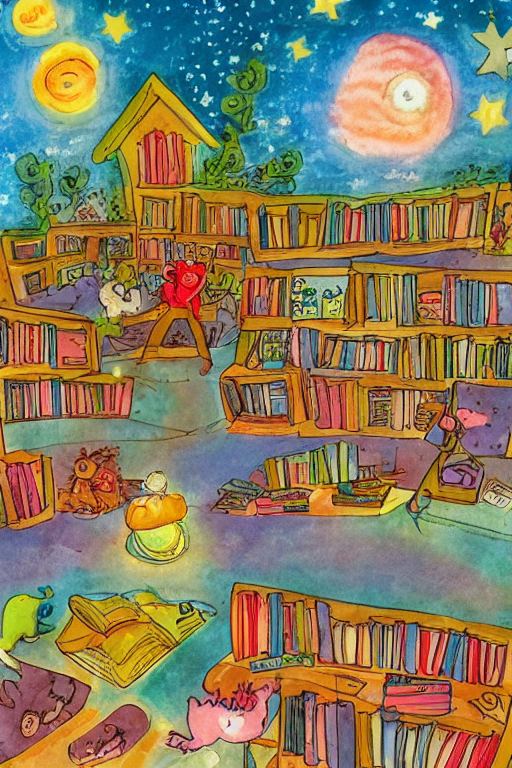

In [14]:
# Generate an image for a book cover
prompt = "A library at midnight under a sky filled with stars, <book-illustration> style"
image = stable_diffusion(prompt, width=512, height=768, num_inference_steps=25).images[0]

image

Here I attempted to modify the prompt to the the required text to the image that was generated in the previous part, but this did not produce legible text either.

In [16]:
# Load Ip Adapters to modify the prompt
stable_diffusion.load_ip_adapter("../models/IP-Adapter", subfolder="models", weight_name="ip-adapter_sd15.bin")


  0%|          | 0/25 [00:00<?, ?it/s]

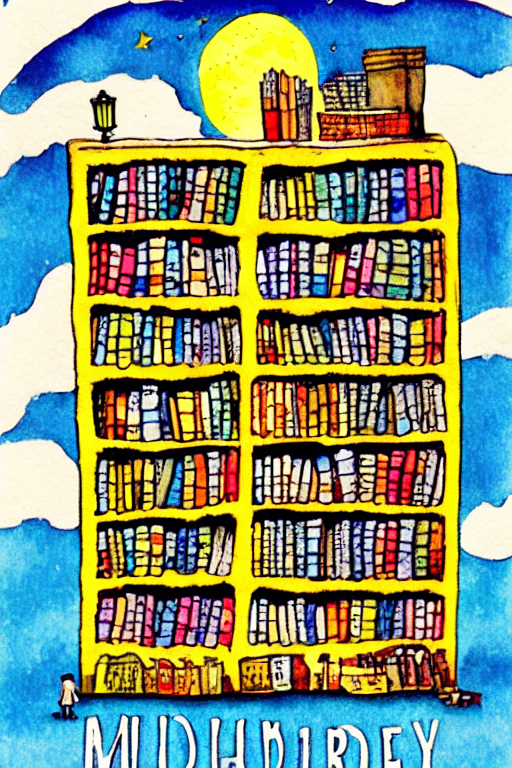

In [17]:
# Try using ip adapters to add text

# Set the ip adapter scale
stable_diffusion.set_ip_adapter_scale(0.6)

# Add the previously cover as the ip image
ipImage = load_image("cover.png")

image = stable_diffusion(prompt="Add the text \"The Midnight Library\"", width=512, height=768, ip_adapter_image=ipImage, num_inference_steps=25).images[0]


image

## Using inpainting to add text to the image 

Here I used the stable-diffusion-inpainting model to add text to the image generated by creating a mask of the text to add to the image. The code to create a mask for the text is from https://medium.com/the-research-nest/ow-to-create-fancy-artistic-text-effects-using-stable-diffusion-1857169f8c5d

In [7]:
# Create a text image 

from PIL import Image, ImageDraw, ImageFont
import numpy as np


# Returns a PIL image of text in black at the center of a 512*512 white background
def create_text(text, font_size):
    # font = ImageFont.load("arial.pil")
    font = ImageFont.truetype("Roboto/Roboto-Bold.ttf", font_size)

    # Create a new image with a white background
    image = Image.new("RGB", (512, 768), (255, 255, 255))

    # Get the size of the text and calculate its position in the center of the image
    text_size = font.getbbox(text)
    text_x = (image.width - text_size[2]) / 2
    text_y = (image.height - text_size[3]) / 2

    # A method to create thicker text on the image
    num_layers = 3
    offset = 2

    # Draw the text onto the image multiple times with a slight offset to create a shadow effect
    draw = ImageDraw.Draw(image)
    for i in range(num_layers):
        x = text_x + (i * offset)
        y = text_y + (i * offset)
        draw.text((x, y), text, font=font, fill=(0, 0, 0))

    # Draw the final text layer on top of the shadows
    draw.text((text_x, text_y), text, font=font, fill=(0, 0, 0))

    return image

In [9]:
# Create a mask for an image

def create_mask(image, param):
    # Convert the image to grayscale
    gray_image = image.convert('L')

    # Convert the grayscale image to a numpy array
    gray_array = np.array(gray_image)

    # Threshold the array to create a binary mask
    threshold = 128

    # letter -> letter is painted white
    # background -> background is painted white
    # All the white area is used for inpainting
    if param == 'letter':
        mask_array = np.where(gray_array > threshold, 0, 255).astype(np.uint8)
    if param == 'background':
        mask_array = np.where(gray_array > threshold, 255, 0).astype(np.uint8)
    
    # Convert the mask array back to a PIL image
    mask_image = Image.fromarray(mask_array)

    return mask_image



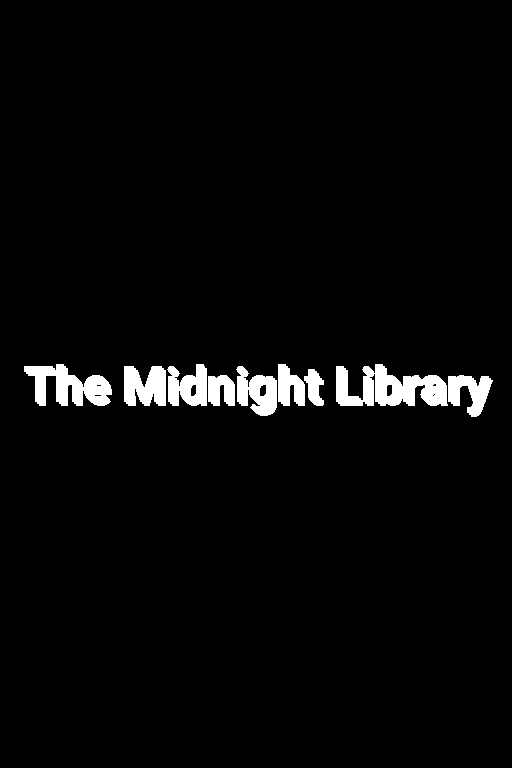

In [10]:
# Create a mask for the text 

letters = create_text("The Midnight Library", 50)
letter_mask = create_mask(letters, "letter")

letter_mask

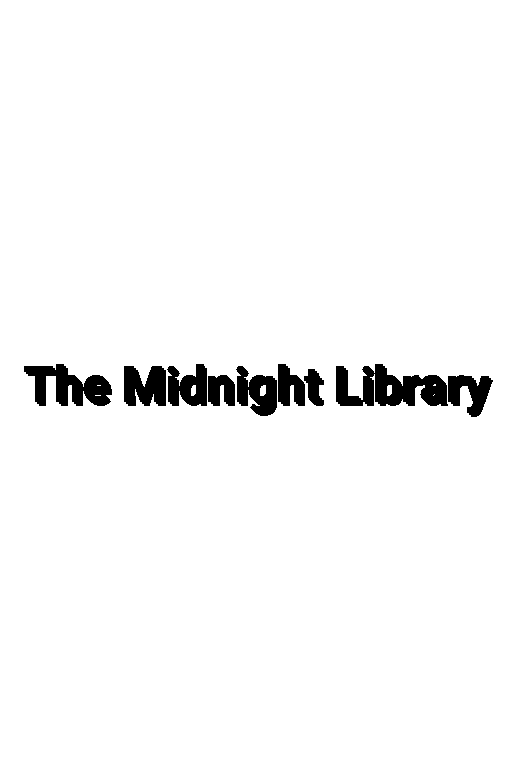

In [11]:
# Create a mask for the background

bg_mask = create_mask(letters, "background")

bg_mask

In [38]:
# Try using an inpainting model

ip = AutoPipelineForInpainting.from_pretrained("../models/stable-diffusion-inpainting", torch_dtype=torch.float16).to("mps")



Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]An error occurred while trying to fetch ../models/stable-diffusion-inpainting/vae: Error no file named diffusion_pytorch_model.safetensors found in directory ../models/stable-diffusion-inpainting/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
Loading pipeline components...:  43%|████▎     | 3/7 [00:00<00:00,  9.65it/s]An error occurred while trying to fetch ../models/stable-diffusion-inpainting/unet: Error no file named diffusion_pytorch_model.safetensors found in directory ../models/stable-diffusion-inpainting/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
Loading pipeline components...: 100%|██████████| 7/7 [00:05<00:00,  1.26it/s]


100%|██████████| 25/25 [00:59<00:00,  2.37s/it]


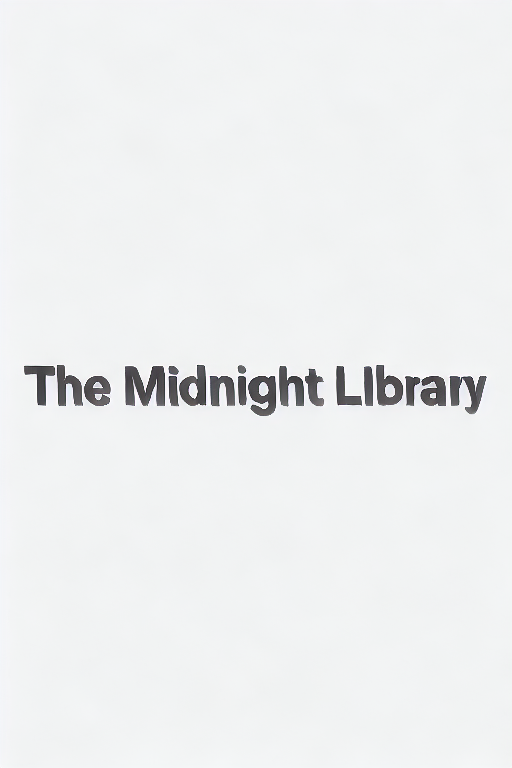

In [39]:
# Add color to our text

image = ip(prompt="purple", image=letters, mask_image=letter_mask, width=512, height=768, num_inference_steps=25).images[0]

image


Here I used the ip adapter along with the mask of the text generated to include the text in the image.

100%|██████████| 25/25 [00:35<00:00,  1.41s/it]


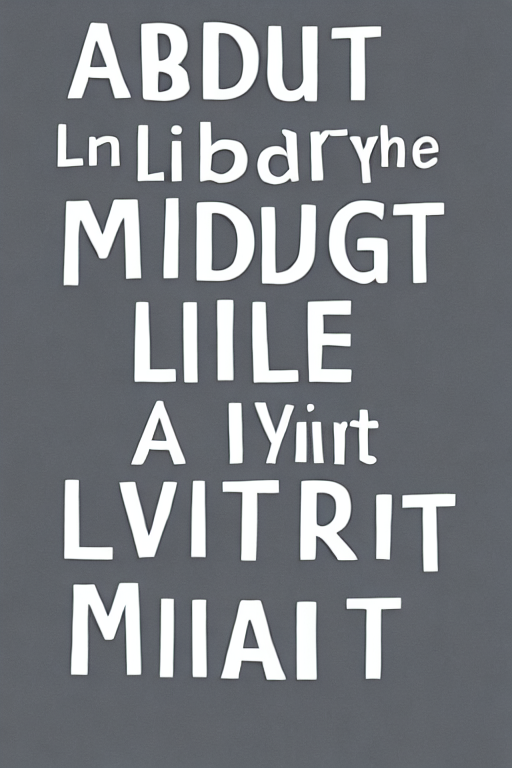

In [79]:
# Try using this image with ip adapters

# Load Ip Adapters to modify the prompt
stable_diffusion.load_ip_adapter("../models/IP-Adapter", subfolder="models", weight_name="ip-adapter_sd15.bin")

# Set the ip adapter scale
stable_diffusion.set_ip_adapter_scale(0.6)

# Add the previously generated text image as reference image
imagetext = load_image("text.png")


image = stable_diffusion(prompt="A library at midnight under a sky filled with stars, <book-illustration> style", width=512, height=768, ip_adapter_image=imagetext, num_inference_steps=25).images[0]

image

The previous attempt was able to generate legible text, but it is incomprehensive. Here I am using the ip adapter along with an inpainting pipeline. This approach does succeed in adding the text to the image, but it is not the best quality.

100%|██████████| 25/25 [00:27<00:00,  1.11s/it]


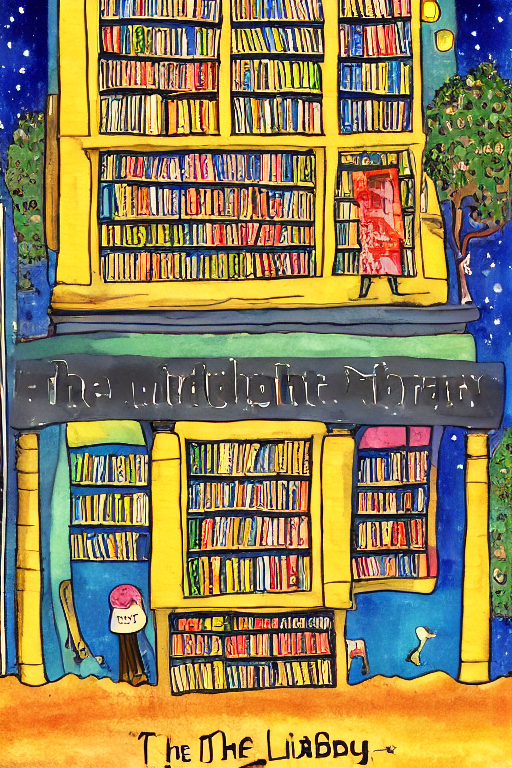

In [10]:
# Add text using an ip adapter for inpainting

# Add the previously generated cover image as the ip image
ipImage = load_image("cover.png")

# Add the previously generated text image as reference image
imagetext = load_image("text.png")

ip.load_ip_adapter("../models/IP-Adapter", subfolder="models", weight_name="ip-adapter_sd15.bin")
ip.set_ip_adapter_scale(0.6)

image = ip(prompt="An image with the words \"The Midnight Library\".", width=512, height=768, ip_adapter_image=ipImage, mask_image=bg_mask, image=imagetext, num_inference_steps=25).images[0]


image

Here I used the inpainting pipeline along with a mask for the background. 

In [47]:
# Try inpainting the background
ip_sd = StableDiffusionInpaintPipeline.from_pretrained("../models/stable-diffusion-inpainting", torch_dtype=torch.float16).to("mps")

# Add the concept
ip_sd.load_textual_inversion("sd-book-illustrations", use_safetensors=True)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]An error occurred while trying to fetch ../models/stable-diffusion-inpainting/vae: Error no file named diffusion_pytorch_model.safetensors found in directory ../models/stable-diffusion-inpainting/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
Loading pipeline components...:  43%|████▎     | 3/7 [00:00<00:00,  9.56it/s]An error occurred while trying to fetch ../models/stable-diffusion-inpainting/unet: Error no file named diffusion_pytorch_model.safetensors found in directory ../models/stable-diffusion-inpainting/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
Loading pipeline components...: 100%|██████████| 7/7 [00:06<00:00,  1.07it/s]


100%|██████████| 25/25 [00:29<00:00,  1.17s/it]


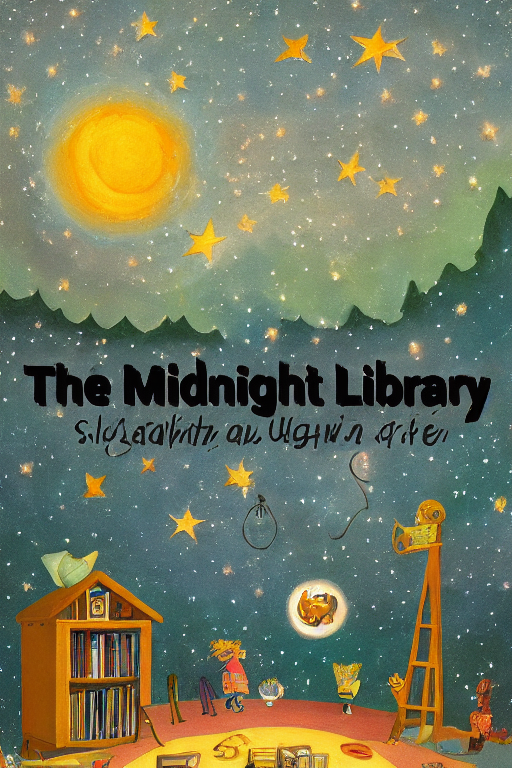

In [49]:
image = ip_sd(prompt="A library at midnight under a sky filled with stars, <book-illustration> style", image=letters, mask_image=bg_mask, width=512, height=768, num_inference_steps=25).images[0]

image

## Try with some classic books

100%|██████████| 25/25 [00:31<00:00,  1.26s/it]


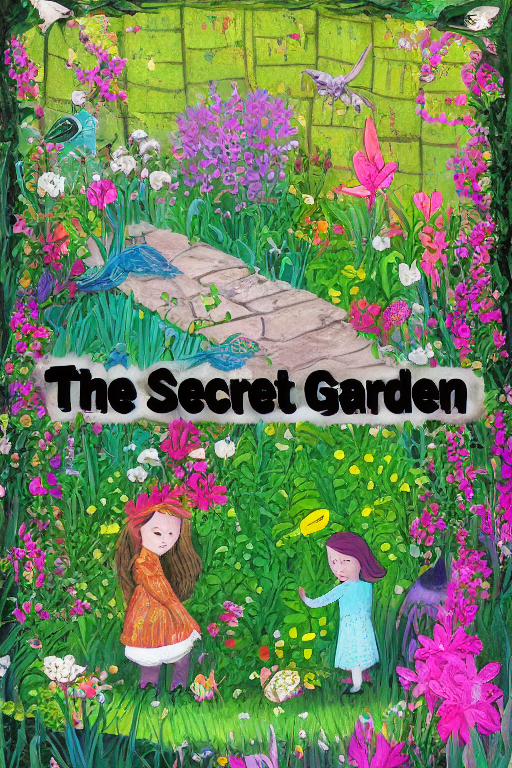

In [77]:
# The secret garden

# Create mask for letters
letters = create_text("The Secret Garden", 50)
letter_mask = create_mask(letters, "letter")

# Create mask for background
bg_mask = create_mask(letters, "background")


image = ip_sd(prompt="A girl in a hidden garden, <book-illustration> style", image=letters, mask_image=bg_mask, width=512, height=768, num_inference_steps=25).images[0]

image

100%|██████████| 25/25 [00:28<00:00,  1.16s/it]


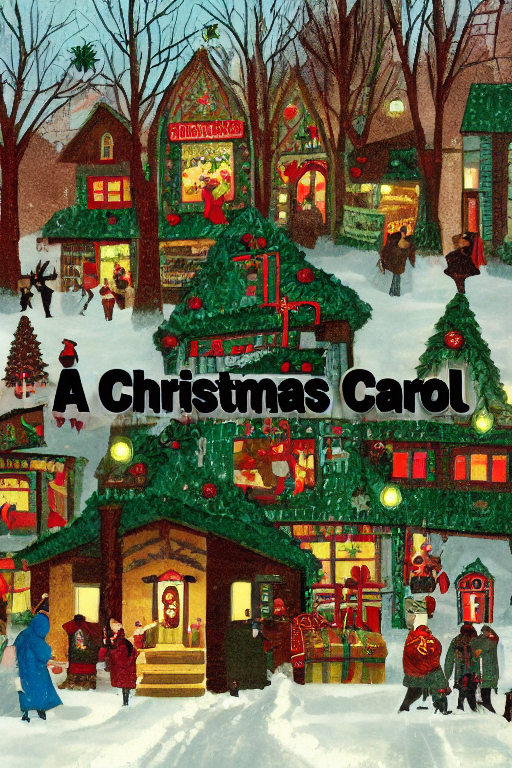

In [72]:
# A christmas carol

# Create mask for letters
letters = create_text("A Christmas Carol", 50)
letter_mask = create_mask(letters, "letter")

# Create mask for background
bg_mask = create_mask(letters, "background")


image = ip_sd(prompt="A man in a town during christmas, <book-illustration> style", image=letters, mask_image=bg_mask, width=512, height=768, num_inference_steps=25).images[0]

image

100%|██████████| 25/25 [00:26<00:00,  1.07s/it]


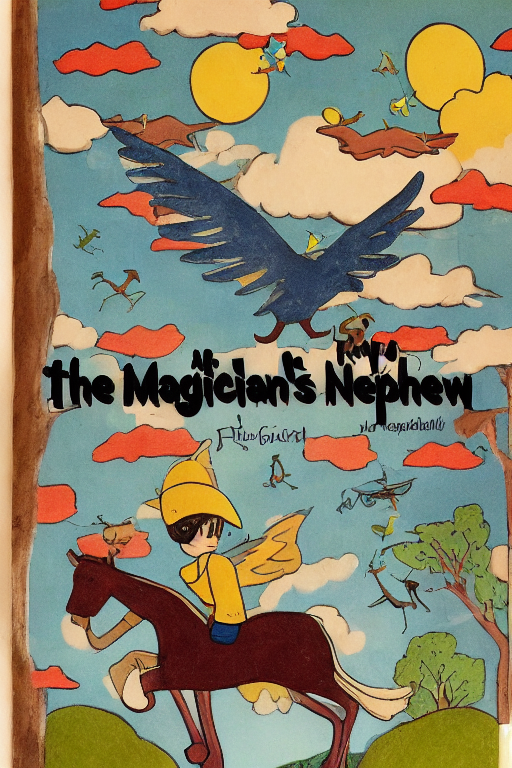

In [78]:
# The magicians nephew

# Create mask for letters
letters = create_text("The Magician's Nephew", 40)
letter_mask = create_mask(letters, "letter")

# Create mask for background
bg_mask = create_mask(letters, "background")


image = ip_sd(prompt="A boy on a horse with wings in the sky, <book-illustration> style", image=letters, mask_image=bg_mask, width=512, height=768, num_inference_steps=25).images[0]

image

In [82]:
# Switching out the text encoder for stable diffusion (doesn't work)

from transformers import AutoModel, AutoTokenizer

! pip install -U bitsandbytes
! pip install accelerate

text_encoder = AutoModel.from_pretrained("google-t5/t5-small", load_in_8bit=True, variant="8bit")
text_tokenizer = AutoTokenizer.from_pretrained("google-t5/t5-small", load_in_8bit=True, variant="8bit")

pipeline = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5",
													text_encoder=text_encoder, safety_checker=None,
													#torch_dtype=torch.float16, variant='fp16'
													).to("mps")

pipeline.load_textual_inversion("sd-book-illustrations", use_safetensors=True)

prompt="A library at midnight under a sky filled with stars, <book-illustration> style"


image = pipeline(prompt=prompt,
			     height=512,
			     width=768,
			     num_inference_steps=25,
			     ).images[0]
image



102966.57s - pydevd: Sending message related to process being replaced timed-out after 5 seconds


  Obtaining dependency information for bitsandbytes from https://files.pythonhosted.org/packages/9b/63/489ef9cd7a33c1f08f1b2be51d1b511883c5e34591aaa9873b30021cd679/bitsandbytes-0.42.0-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.0/105.0 MB 14.3 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: bitsandbytes
    Found existing installation: bitsandbytes 0.40.0
    Uninstalling bitsandbytes-0.40.0:
      Successfully uninstalled bitsandbytes-0.40.0

[notice] A new release of pip is available: 23.2.1 -> 24.1.2
[notice] To update, run: pip install --upgrade pip


102986.88s - pydevd: Sending message related to process being replaced timed-out after 5 seconds



[notice] A new release of pip is available: 23.2.1 -> 24.1.2
[notice] To update, run: pip install --upgrade pip


The `load_in_4bit` and `load_in_8bit` arguments are deprecated and will be removed in the future versions. Please, pass a `BitsAndBytesConfig` object in `quantization_config` argument instead.


RuntimeError: No GPU found. A GPU is needed for quantization.

In [4]:
from huggingface_hub import interpreter_login

interpreter_login()

In [10]:
# Stable Diffusion 3

from diffusers import StableDiffusion3Pipeline, DiffusionPipeline
import torch

pipe = StableDiffusion3Pipeline.from_pretrained("stabilityai/stable-diffusion-3-medium-diffusers", torch_dtype=torch.float16)
pipe = pipe.to("cuda")

# pipe.load_textual_inversion("sd-book-illustrations", use_safetensors=True)

prompt="A library at midnight under a sky filled with stars with the words \"The Midnight Library\" superimposed on the image." #, <book-illustration> style"

image = pipe(
    prompt=prompt,
    num_inference_steps=25,
    width=512,
    height=768
).images[0]


image


Loading pipeline components...:   0%|          | 0/9 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

RuntimeError: MPS backend out of memory (MPS allocated: 18.13 GB, other allocations: 768.00 KB, max allowed: 18.13 GB). Tried to allocate 80.00 MB on private pool. Use PYTORCH_MPS_HIGH_WATERMARK_RATIO=0.0 to disable upper limit for memory allocations (may cause system failure).